# Bayesian filtering: tracking multiple sensors using radio pings

Load the libraries we need.

In [1]:
import math
import time
import sys
import numpy as np
from scipy import misc
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib import patches

## Define the variables

We want to define and name the state variables $\mathbf{X}$ and the sensor variables $\mathbf{Y}$ that we will use in the probability distributions below.

For our current problem, there are four types of radio sensors: child sensors, material sensors, teacher sensors, and area sensors. Child, material, and teacher sensors are moving sensors in the sense that we are trying to track their position over time. Area sensors are fixed sensors in the sense that we may move them around from day to day, but we expect their positions to be fixed over the course of the day and we are not trying to track their positions.

Therefore, for our current problem, the state variables $\mathbf{X}$ are the positions of each of the moving sensors (in meters) along two dimensions (denoted $l$ and $w$ to avoid confusion with $\mathbf{X}$ and $\mathbf{Y}$). The positions of the fixed sensors are not included in the state space. (At some point, we may infer the positions of the fixed sensors in a separate, overall, time-independent inference step. For now, we just treat their positions as fixed parameters to the later functions, so they won't appear among our $\mathbf{X}$ variables.)

All of the sensors exchange pings with each other. The sensor variables $\mathbf{Y}$ are the status of each of these pings (received or not received) and, if received, the RSSI of the received ping. In our current setup, we do not store data about pings from material to material, teacher to teacher, area to area, material to area, or area to material, so we need to exclude these from our variable set.

Define the number of each type of sensor.

In [2]:
num_child_sensors = 2
num_material_sensors = 2
num_teacher_sensors = 2
num_area_sensors = 4

Define the names of the sensors.

In [3]:
child_sensor_names = ['Child sensor {}'.format(i + 1) for i in range(num_child_sensors)]
material_sensor_names = ['Material sensor {}'.format(i + 1) for i in range(num_material_sensors)]
teacher_sensor_names = ['Teacher sensor {}'.format(i + 1) for i in range(num_teacher_sensors)]
area_sensor_names = ['Area sensor {}'.format(i + 1) for i in range(num_area_sensors)]
    
moving_sensor_names = child_sensor_names + material_sensor_names + teacher_sensor_names
fixed_sensor_names = area_sensor_names
sensor_names = moving_sensor_names + fixed_sensor_names

Define the number of moving and fixed sensors.

In [4]:
num_moving_sensors = len(moving_sensor_names)
num_fixed_sensors = len(fixed_sensor_names)
num_sensors=len(sensor_names)

Define the names of the spatial dimensions.

In [5]:
dimension_names = [
    '$l$',
    '$w$'
]

Define the number of spatial dimensions.

In [6]:
num_dimensions = len(dimension_names)

### Define the names of the $\mathbf{X}$ variables

First, we define the names of the discrete $\mathbf{X}$ variables.

For now, we have no discrete $\mathbf{X}$ variables. In the future, we may include things like discrete variables for whether or not a sensor is present on the mesh, but for now, this is just a placeholder.

In [7]:
x_discrete_names = []

Now we want to define the names of the continuous $\mathbf{X}$ variables. A natural way to do this is to first define a matrix with _all_ of the sensors down one axis and all of the spatial dimensions across the other axis, then extract and flatten those quantities that refer to the state variables we are actually tracking (the moving sensors). Because we will want to do this sort of thing at several points later, we define some reusable machinery to do this extraction.

Construct the matrix of all possible continuous $\mathbf{X}$ variable names.

In [8]:
sensor_position_name_matrix = [['{} {} position'.format(sensor_name, dimension_name)
                                for dimension_name in dimension_names]
                               for sensor_name in sensor_names]

Define a function which extracts the subset of valid $\mathbf{X}$ variables and flattens them into a one-dimensional array. We construct this function to act only on the last two dimensions, leaving open the possibility that the input can be an array of such matrices.

In [9]:
extract_x_variables_mask = np.full((num_sensors, num_dimensions), True)

In [10]:
extract_x_variables_mask[num_moving_sensors:,:] = False

In [11]:
def extract_x_variables(a):
    return a[...,extract_x_variables_mask]

Use this function to extract the names of the continuous $\mathbf{X}$ variables. Note that this function is designed to work with Numpy arrays (because we're going to be using it on numbers), so we have to convert the result back to a list when we're done (since lists are more appropriate for strings).

In [12]:
x_continuous_names = extract_x_variables(np.array(sensor_position_name_matrix)).tolist()

### Define the names of the $\mathbf{Y}$ variables

Similar to the continuous $\mathbf{X}$ variables above, a natural way to define the $\mathbf{Y}$ variables is to first define a matrix with all of the sensors down one axis and all of the sensors across the other axis, then extract and flatten the quantities that correspond to actual sensor variables that we are tracking (the ping data that we actually store). Because we will want to do this sort of thing at several points later (e.g., when calculating the distances between the sensors, the measured RSSI of pings, etc.), we define some reusable machinery to do this extraction.

Construct the matrix of all possible discrete $\mathbf{Y}$ variable names.

In [13]:
y_discrete_name_matrix = [['Status of ping from {} to {}'.format(sending_sensor_name, receiving_sensor_name)
                           for receiving_sensor_name in sensor_names]
                          for sending_sensor_name in sensor_names]

Construct the matrix of all possible continuous $\mathbf{Y}$ variable names.

In [14]:
y_continuous_name_matrix = [['RSSI of ping from {} to {}'.format(sending_sensor_name, receiving_sensor_name)
                             for receiving_sensor_name in sensor_names]
                            for sending_sensor_name in sensor_names]

Construct a mask with the same shape as these matrices.

In [15]:
extract_y_variables_mask = np.full((num_sensors, num_sensors), True)

Sensors don't send pings to themselves.

In [16]:
np.fill_diagonal(extract_y_variables_mask, False)

We don't store pings from material sensors to other material sensors.

In [17]:
extract_y_variables_mask[num_child_sensors:(num_child_sensors+num_material_sensors),
                        num_child_sensors:(num_child_sensors+num_material_sensors)] = False

We don't store pings from teacher sensors to other teacher sensors.

In [18]:
extract_y_variables_mask[(num_child_sensors+num_material_sensors):num_moving_sensors,
                        (num_child_sensors+num_material_sensors):num_moving_sensors] = False

We don't store pings from area sensors to other area sensors.

In [19]:
extract_y_variables_mask[num_moving_sensors:,
                        num_moving_sensors:] = False

We don't store pings from material sensors to area sensors (and _vice versa_).

In [20]:
extract_y_variables_mask[num_child_sensors:(num_child_sensors+num_material_sensors),
                        num_moving_sensors:] = False
extract_y_variables_mask[num_moving_sensors:,
                         num_child_sensors:(num_child_sensors+num_material_sensors)] = False

Define a function which uses this mask to extract the subset of valid $\mathbf{Y}$ variables and flattens them into a one-dimensional array.

In [21]:
def extract_y_variables(a):
    return a[..., extract_y_variables_mask]

Use our matrix to extract a flattened list of allowed variable names.

In [22]:
y_discrete_names = extract_y_variables(np.array(y_discrete_name_matrix)).tolist()

In [23]:
y_continuous_names = extract_y_variables(np.array(y_continuous_name_matrix)).tolist()

Define the names of the different ping statuses.

In [24]:
ping_status_names = [
    'Received',
    'Not received'
]

Define constants for the number of $\mathbf{X}$ variables, the number of $\mathbf{Y}$ variables, and the number of ping statuses (since we'll need these in a bunch of places).

In [25]:
num_x_discrete_vars = len(x_discrete_names)
num_x_continuous_vars = len(x_continuous_names)

num_y_discrete_vars = len(y_discrete_names)
num_y_continuous_vars = len(y_continuous_names)

num_ping_statuses = len(ping_status_names)

Print out all of these variables to make sure they are what we expect.

In [26]:
x_discrete_names

[]

In [27]:
x_continuous_names

['Child sensor 1 $l$ position',
 'Child sensor 1 $w$ position',
 'Child sensor 2 $l$ position',
 'Child sensor 2 $w$ position',
 'Material sensor 1 $l$ position',
 'Material sensor 1 $w$ position',
 'Material sensor 2 $l$ position',
 'Material sensor 2 $w$ position',
 'Teacher sensor 1 $l$ position',
 'Teacher sensor 1 $w$ position',
 'Teacher sensor 2 $l$ position',
 'Teacher sensor 2 $w$ position']

In [28]:
y_discrete_names

['Status of ping from Child sensor 1 to Child sensor 2',
 'Status of ping from Child sensor 1 to Material sensor 1',
 'Status of ping from Child sensor 1 to Material sensor 2',
 'Status of ping from Child sensor 1 to Teacher sensor 1',
 'Status of ping from Child sensor 1 to Teacher sensor 2',
 'Status of ping from Child sensor 1 to Area sensor 1',
 'Status of ping from Child sensor 1 to Area sensor 2',
 'Status of ping from Child sensor 1 to Area sensor 3',
 'Status of ping from Child sensor 1 to Area sensor 4',
 'Status of ping from Child sensor 2 to Child sensor 1',
 'Status of ping from Child sensor 2 to Material sensor 1',
 'Status of ping from Child sensor 2 to Material sensor 2',
 'Status of ping from Child sensor 2 to Teacher sensor 1',
 'Status of ping from Child sensor 2 to Teacher sensor 2',
 'Status of ping from Child sensor 2 to Area sensor 1',
 'Status of ping from Child sensor 2 to Area sensor 2',
 'Status of ping from Child sensor 2 to Area sensor 3',
 'Status of ping f

In [29]:
y_continuous_names

['RSSI of ping from Child sensor 1 to Child sensor 2',
 'RSSI of ping from Child sensor 1 to Material sensor 1',
 'RSSI of ping from Child sensor 1 to Material sensor 2',
 'RSSI of ping from Child sensor 1 to Teacher sensor 1',
 'RSSI of ping from Child sensor 1 to Teacher sensor 2',
 'RSSI of ping from Child sensor 1 to Area sensor 1',
 'RSSI of ping from Child sensor 1 to Area sensor 2',
 'RSSI of ping from Child sensor 1 to Area sensor 3',
 'RSSI of ping from Child sensor 1 to Area sensor 4',
 'RSSI of ping from Child sensor 2 to Child sensor 1',
 'RSSI of ping from Child sensor 2 to Material sensor 1',
 'RSSI of ping from Child sensor 2 to Material sensor 2',
 'RSSI of ping from Child sensor 2 to Teacher sensor 1',
 'RSSI of ping from Child sensor 2 to Teacher sensor 2',
 'RSSI of ping from Child sensor 2 to Area sensor 1',
 'RSSI of ping from Child sensor 2 to Area sensor 2',
 'RSSI of ping from Child sensor 2 to Area sensor 3',
 'RSSI of ping from Child sensor 2 to Area sensor 4'

In [30]:
num_x_discrete_vars

0

In [31]:
num_x_continuous_vars

12

In [32]:
num_y_discrete_vars

58

In [33]:
num_y_continuous_vars

58

In [34]:
num_ping_statuses

2

## Create the probability models

The particle filter takes three probability models as inputs: the initial state model $f(\mathbf{X}_0)$, the transition model $f(\mathbf{X}_t | \mathbf{X}_{t-1})$, and the sensor response model $f(\mathbf{Y} | \mathbf{X})$.

For the current problem, we define the room as a rectangle which is 20 meters long and 10 meters wide. The initial positions of the (moving) sensors are distributed uniformly within the room. The transition model for the sensors is a two-dimensional random walk for each sensor. The sensor response model is that the sensors measure the status of the ping between each pair of sensors and, if the ping is received, the RSSI of the ping (in dB).

### Initial state model

Define  the initial state model $f(\mathbf{X}_0)$. For both the particle filter and to generate simulated data, we need this function in form of a sampling function that generates samples of the initial state $\mathbf{X}_0$.

For the current problem, we assume that the sensors are initially distributed uniformly throughout the room.

Define the room as a rectangle which is 20 meters long and 10 meters wide.

In [37]:
room_size = np.array([20.0, 10.0])

Define a function that generates samples of the initial state $\mathbf{X}_0$.

In [38]:
def x_initial_sample(num_samples=1):
    x_discrete_initial_sample = np.array([])
    x_continuous_initial_sample = np.squeeze(extract_x_variables(np.random.uniform(high=np.tile(room_size,
                                                                                                (num_sensors, 1)),
                                                                                   size=(num_samples,
                                                                                         num_sensors,
                                                                                         num_dimensions))))
    return x_discrete_initial_sample, x_continuous_initial_sample

Generate 1,000 samples and check that they have the properties we expect.

In [39]:
time_start = time.clock()
x_discrete_initial_samples, x_continuous_initial_samples = x_initial_sample(1000)
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.00239658666667


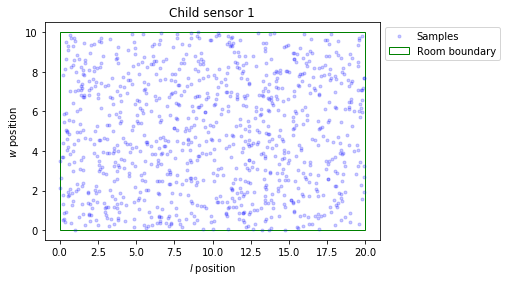

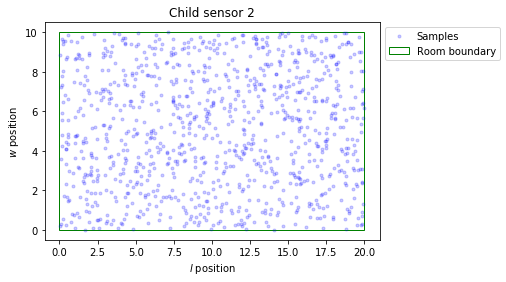

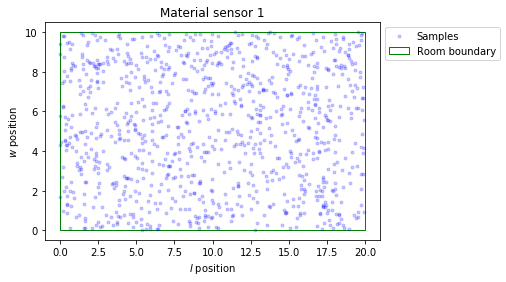

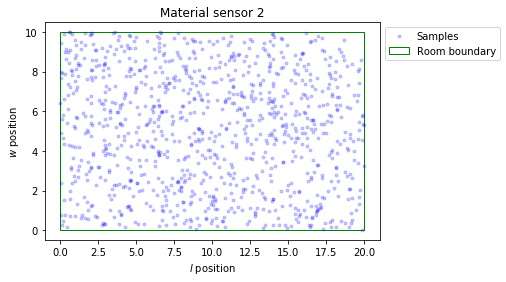

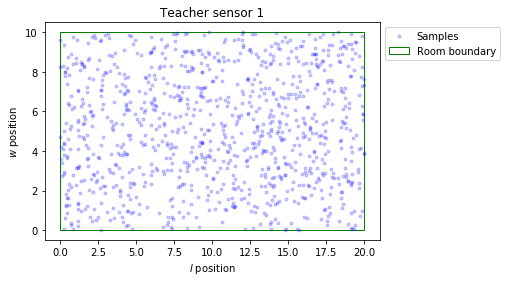

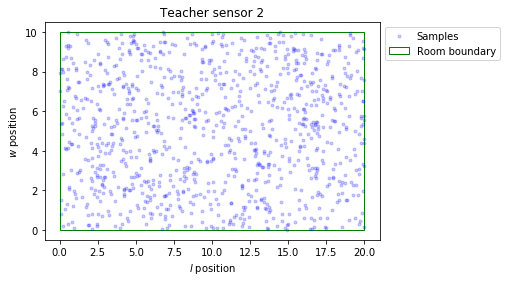

In [40]:
for sensor_index in range(num_moving_sensors):
    plt.plot(x_continuous_initial_samples[:,sensor_index*2],
             x_continuous_initial_samples[:,sensor_index*2 + 1],
             'b.',
             alpha = 0.2,
             label="Samples")
    plt.title(sensor_names[sensor_index])
    plt.xlabel('{} position'.format(dimension_names[0]))
    plt.ylabel('{} position'.format(dimension_names[1]))
    ax=plt.gca()
    ax.add_patch(patches.Rectangle((0,0),
                                   room_size[0],
                                   room_size[1],
                                   fill=False,
                                   color='green',
                                   label='Room boundary'))
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

### Transition model

Define the transition model $f(\mathbf{X}_t |\mathbf{X}_{t-1})$. For both the particle filter and to generate simulated data, we need this function in the form of a sampling function that generates samples of the state $\mathbf{X}_t$ given $\mathbf{X}_{t-1}$. 

For the current problem, we assume that moving sensors execute a simple 2-d random walk.

Define the drift distance (in meters) from one timestep to the next.

In [41]:
moving_sensor_drift = 0.5

Define a function that generates samples of $\mathbf{X}_t$, given $\mathbf{X}_{t-1}$.

In [42]:
def x_bar_x_prev_sample(x_discrete_prev, x_continuous_prev):
    x_discrete_bar_x_prev_sample = np.array([])
    x_continuous_bar_x_prev_sample = np.random.normal(loc=x_continuous_prev, scale=moving_sensor_drift)
    return x_discrete_bar_x_prev_sample, x_continuous_bar_x_prev_sample

Choose an arbitrary test value for $\mathbf{X}$, drawn from the initial distribution, that we can use to test the various functions.

In [56]:
test_x_discrete_value, test_x_continuous_value = x_initial_sample()

In [57]:
test_x_continuous_value

array([  9.20585812,   6.07478513,  14.10669045,   9.25820445,
         9.06411685,   5.37715756,  15.77749778,   6.98854619,
        13.15893355,   4.84189557,  13.33106673,   2.95049543])

Generate 1,000 samples for $\mathbf{X}_t$ (using our test value for $\mathbf{X}_{t-1}$) to make sure they have the properties we expect.

In [58]:
time_start = time.clock()
x_discrete_bar_x_prev_samples, x_continuous_bar_x_prev_samples = x_bar_x_prev_sample(np.array([]),
                                                                                     np.tile(test_x_continuous_value,
                                                                                             (1000,1)))
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.00330325333334


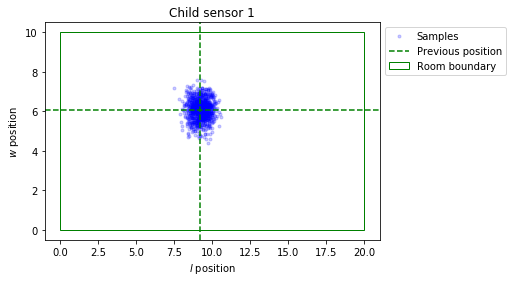

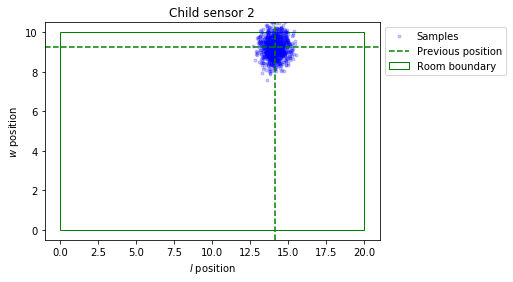

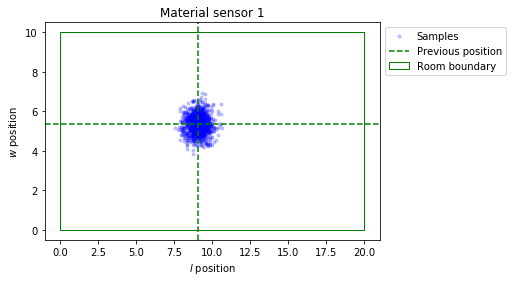

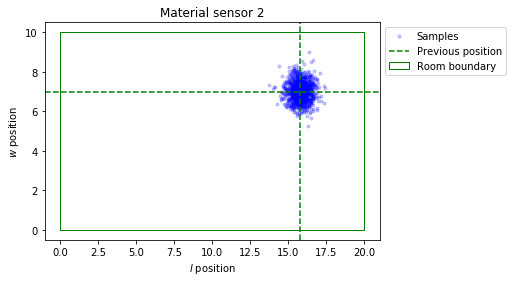

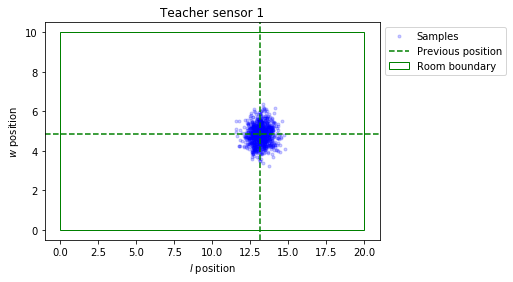

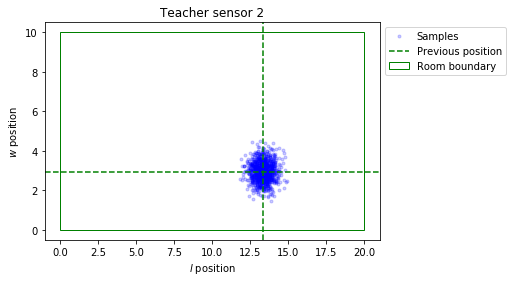

In [59]:
for sensor_index in range(num_moving_sensors):
    plt.plot(x_continuous_bar_x_prev_samples[:,sensor_index*2],
             x_continuous_bar_x_prev_samples[:,sensor_index*2 + 1],
             'b.',
             alpha=0.2,
            label='Samples')
    plt.title(sensor_names[sensor_index])
    plt.xlabel('{} position'.format(dimension_names[0]))
    plt.ylabel('{} position'.format(dimension_names[1]))
    plt.axvline(x=test_x_continuous_value[sensor_index*2],
                linestyle='dashed',
                color='green',
                label='Previous position')
    plt.axhline(y=test_x_continuous_value[sensor_index*2 + 1], linestyle='dashed', color='green')
    ax=plt.gca()
    ax.add_patch(patches.Rectangle((0,0),
                                   room_size[0],
                                   room_size[1],
                                   fill=False,
                                   color='green',
                                   label='Room boundary'))
    plt.xlim(0 - 0.05*room_size[0], room_size[0] + 0.05*room_size[0])
    plt.ylim(0 - 0.05*room_size[1], room_size[1] + 0.05*room_size[1])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

### Sensor response model

Define the sensor response model $f(\mathbf{Y}_t |\mathbf{X}_{t})$. To generate simulated data, we need this function in form of a sampling function that generates samples of the sensor values $\mathbf{Y}_t$ given the state $\mathbf{X}_{t}$. For the particle filter, we need this function in the form of a (log) probability density $f(\mathbf{Y}_t |\mathbf{X}_{t})$. We start with the sampling function.  

#### Produce samples of $\mathbf{Y}$ given $\mathbf{X}$

First, define a function that returns the pairwise distances between the different sensors (in the same order as `y_names` above) given $\mathbf{X}$.

In [60]:
fixed_sensor_positions = np.array ([[1, 1],
                                   [room_size[0] - 1, 1],
                                   [room_size[0] - 1, room_size[1] - 1],
                                   [1, room_size[1] - 1]])

In [70]:
def sensor_positions(x_continuous):
    return np.concatenate((x_continuous.reshape(x_continuous.shape[:-1] + (num_moving_sensors, num_dimensions)),
                           np.broadcast_to(fixed_sensor_positions,
                                           x_continuous.shape[:-1] + fixed_sensor_positions.shape)),
                           axis=-2)

In [62]:
def distances(sensor_positions):
    return extract_y_variables(np.linalg.norm(np.subtract(sensor_positions[...,np.newaxis,:,:],
                                                          sensor_positions[...,:,np.newaxis,:]),
                                              axis = -1))

For the sensors variables that measure the status of the pings, we model the likelihood of receiving the ping as declining exponentially with distance. This roughly mirrors what we see in our real test data. First, we define a function that returns the probability of the two ping statuses (received or not received), given the distance between two sensors.

In [63]:
receive_probability_zero_distance = 1.0 # Value from real data is approximately 1.0
receive_probability_reference_distance = 0.7 #Value from real data is approximately 0.7
reference_distance = 20.0 # Value from real data is approximately 20.0
scale_factor = reference_distance/np.log(receive_probability_reference_distance/receive_probability_zero_distance)

In [64]:
def ping_status_probabilities(distance):
    receive_probability=receive_probability_zero_distance*np.exp(distance/scale_factor)
    return np.stack((receive_probability, 1 - receive_probability), axis=-1)

Plot this function to make sure it has the properties we expect.

In [65]:
distance_range_min = 0.5
distance_range_max = 2*np.linalg.norm(room_size)

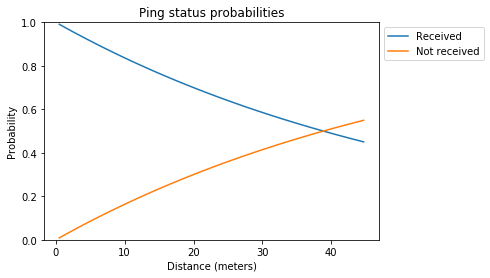

In [66]:
distance_range = np.linspace(distance_range_min, distance_range_max, 100)
ping_status_probabilities_range = ping_status_probabilities(distance_range)
for ping_status_index in range(num_ping_statuses):
    plt.plot(distance_range,
             ping_status_probabilities_range[:, ping_status_index],
             label=ping_status_names[ping_status_index])
plt.ylim(0,1)
plt.xlabel('Distance (meters)')
plt.ylabel('Probability')
plt.title('Ping status probabilities')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

In [67]:
def ping_status_samples(distances):
    return np.apply_along_axis(lambda p_array: np.random.choice(len(p_array), p=p_array),
                               axis=-1,
                               arr=ping_status_probabilities(distances))

Using this function, define a function that returns samples of the discrete $\mathbf{Y}$ variables (the status of all of the pings), given a value of $\mathbf{X}$ (the positions of all of the sensors).

In [68]:
def y_discrete_bar_x_sample(x_discrete, x_continuous):
    return ping_status_samples(distances(sensor_positions(x_continuous)))

Generate 1,000 samples (using our test value for $\mathbf{X}$) to make sure they have the properties we expect.

In [71]:
time_start = time.clock()
y_discrete_bar_x_samples = y_discrete_bar_x_sample(np.tile(test_x_discrete_value, (1000,1)),
                                                   np.tile(test_x_continuous_value, (1000,1)))
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 2.86600576


In [72]:
distances_test_x_continuous_value = distances(sensor_positions(test_x_continuous_value))

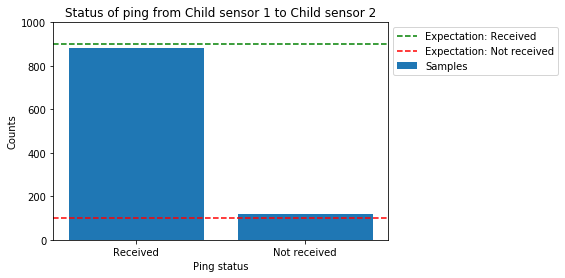

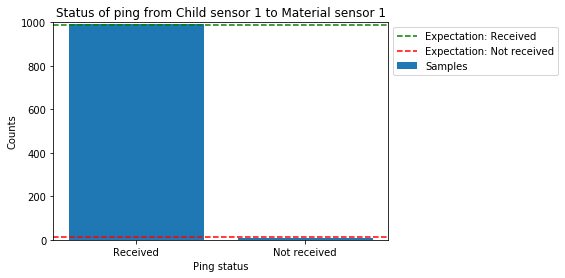

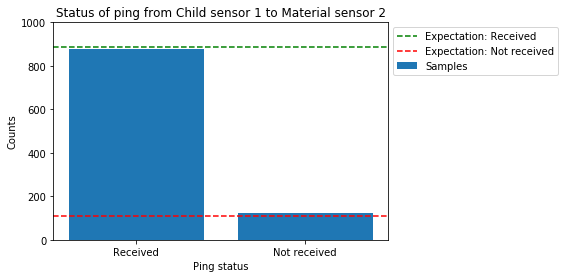

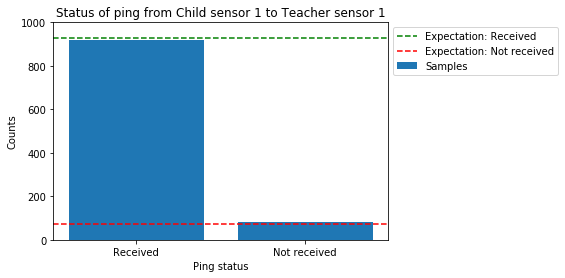

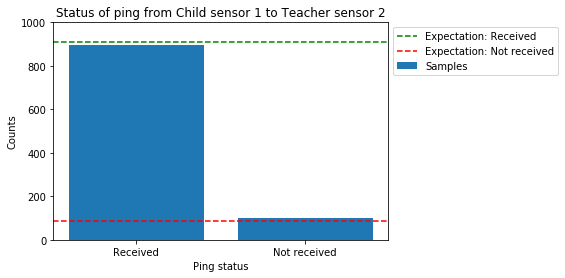

...

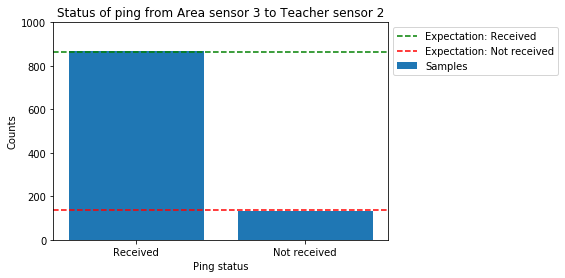

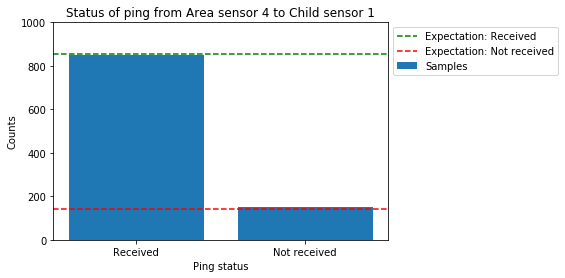

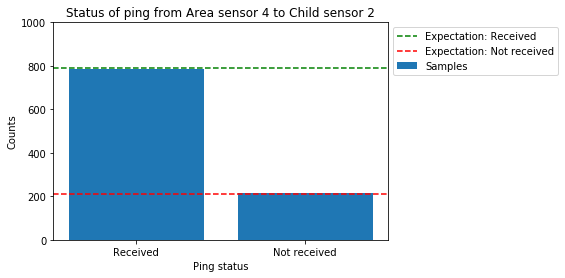

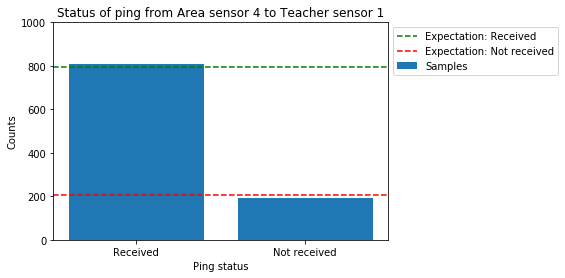

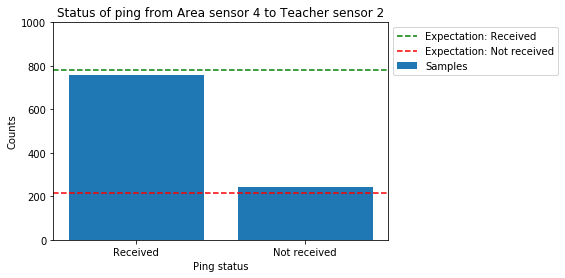

In [73]:
for y_discrete_var_index in range(num_y_discrete_vars):
    plt.bar(range(num_ping_statuses), np.bincount(y_discrete_bar_x_samples[:,y_discrete_var_index]), label='Samples')
    for ping_status_index in range(num_ping_statuses):
        plt.axhline(y=ping_status_probabilities(distances_test_x_continuous_value[y_discrete_var_index])[ping_status_index]*1000,
                    linestyle='dashed',
                    color=['green', 'red'][ping_status_index],
                    label='Expectation: {}'.format(ping_status_names[ping_status_index]))
    plt.xticks(range(num_ping_statuses), ping_status_names)
    plt.xlabel('Ping status')
    plt.ylabel('Counts')
    plt.title(y_discrete_names[y_discrete_var_index])
    plt.ylim(0, 1000)
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

For the sensor variables that measure the RSSI of the received pings, we model the measured RSSI as a Gaussian with a mean that drops off linearly in the log of the distance with a slope of -20 (i.e., $1/d^2$ fall-off), a large amount of noise, and a hard lower cut-off at -82 dB. This roughly mirrors what we see in the real test data. First, we define functions that return the means of the truncated and untruncated distributions, given the distance between the sensors.

In [74]:
rssi_untruncated_mean_intercept = -64.0 # Value for real data is approximately -64.0
rssi_untruncated_mean_slope = -20.0 # Value for real data is approximately -20.0
rssi_untruncated_std_dev = 9.0 # Value for real data is approximately 9.0
lower_rssi_cutoff = -82.0 # Value for real data is approximately -82.0

In [75]:
def rssi_untruncated_mean(distance):
    return rssi_untruncated_mean_intercept + rssi_untruncated_mean_slope*np.log10(distance)

In [76]:
def rssi_truncated_mean(distance):
    return stats.truncnorm.stats(a=(lower_rssi_cutoff - rssi_untruncated_mean(distance))/rssi_untruncated_std_dev,
                                 b=np.inf,
                                 loc=rssi_untruncated_mean(distance),
                                 scale=rssi_untruncated_std_dev,
                                 moments='m')

Plot these functions to make sure they have the properties we expect.

In [77]:
rssi_range_min = rssi_untruncated_mean(distance_range_max)
rssi_range_max = rssi_untruncated_mean(distance_range_min)

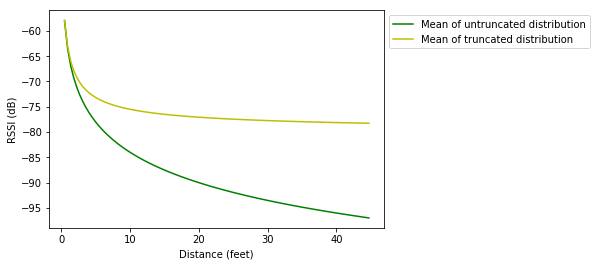

In [79]:
distance_range = np.linspace(distance_range_min, distance_range_max, 100)
plt.plot(distance_range,
         rssi_untruncated_mean(distance_range),
         'g-',
         label='Mean of untruncated distribution')
plt.plot(distance_range,
         rssi_truncated_mean(distance_range),
         'y-',
         label='Mean of truncated distribution')
plt.xlabel('Distance (feet)')
plt.ylabel('RSSI (dB)')
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.show()

Using these functions, define a function that returns a sample of an RSSI measurement, given the distance between two sensors.

In [80]:
def rssi_samples(distances):
    return stats.truncnorm.rvs(a=(lower_rssi_cutoff - rssi_untruncated_mean(distances))/rssi_untruncated_std_dev,
                               b=np.inf,
                               loc=rssi_untruncated_mean(distances),
                               scale=rssi_untruncated_std_dev)

Using this function, define a function that returns a sample of all of the RSSI readings, given all of the sensor positions.

In [81]:
def y_continuous_bar_x_sample(x_discrete, x_continuous):
    return rssi_samples(distances(sensor_positions(x_continuous)))

Generate 100,000 samples (using our test value for $\mathbf{X}$) to make sure they have the properties we expect.

In [82]:
time_start = time.clock()
y_continuous_bar_x_samples = y_continuous_bar_x_sample(np.tile(test_x_discrete_value, (100000, 1)),
                                                       np.tile(test_x_continuous_value, (100000, 1)))
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 3.71514197333


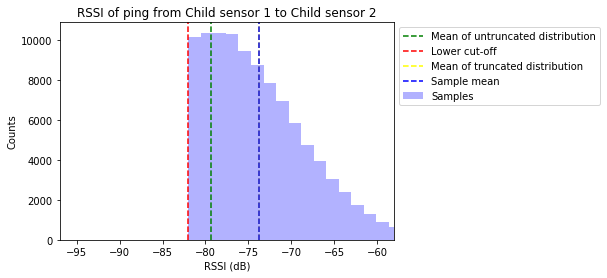

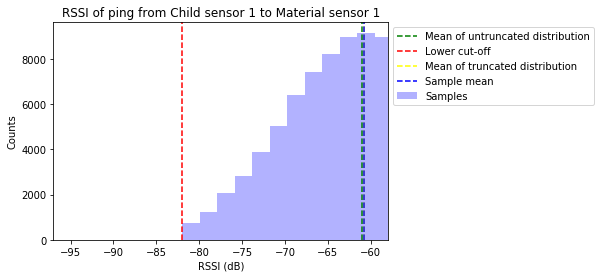

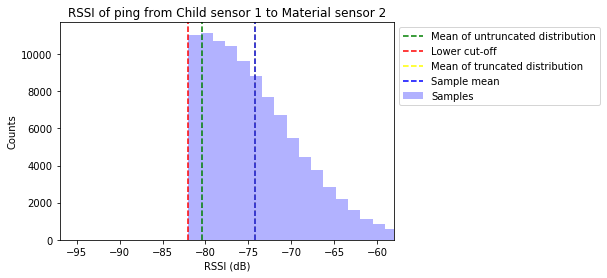

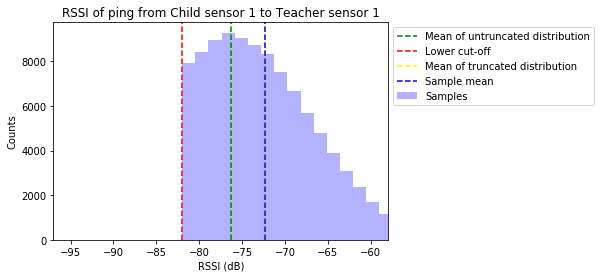

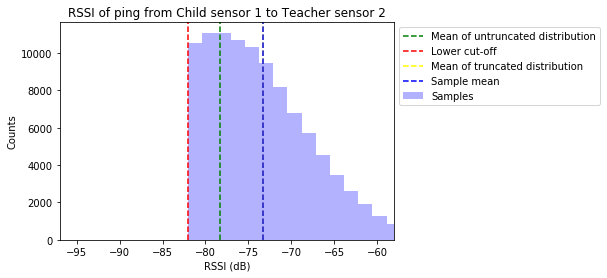

...

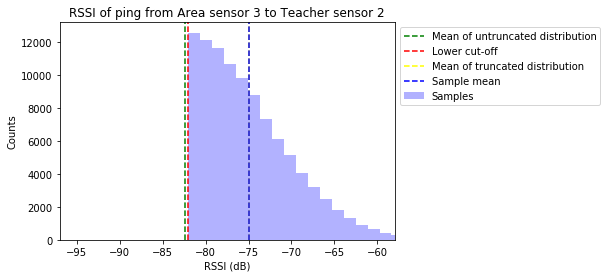

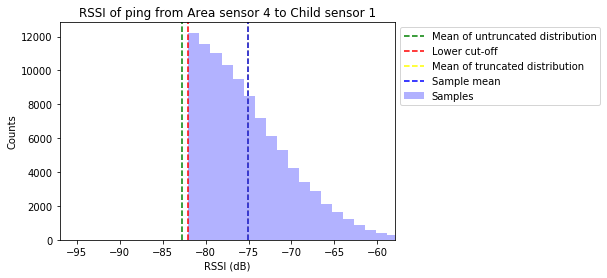

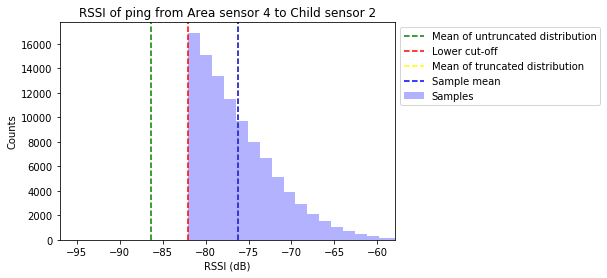

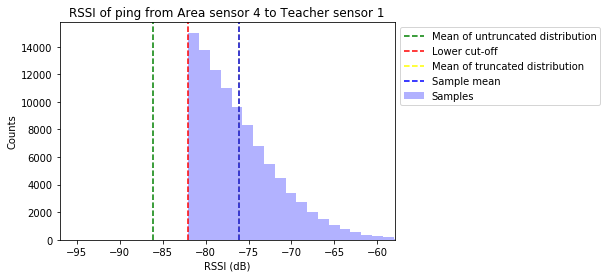

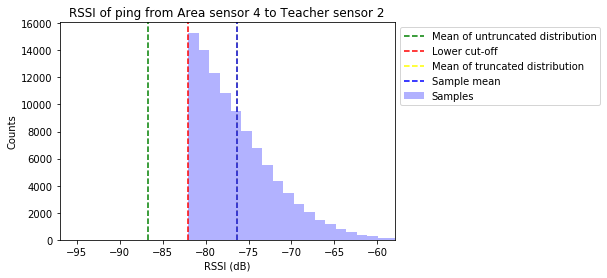

In [83]:
for y_continuous_var_index in range(num_y_continuous_vars):
    plt.hist(y_continuous_bar_x_samples[:,y_continuous_var_index],
             bins=30,
             facecolor='blue',
             alpha=0.3,
             label='Samples')
    plt.axvline(x=rssi_untruncated_mean(distances_test_x_continuous_value[y_continuous_var_index]),
                linestyle='dashed',
                color='green',
                label='Mean of untruncated distribution')
    plt.axvline(lower_rssi_cutoff,
                linestyle='dashed',
                color='red',
                label='Lower cut-off')
    plt.axvline(x=rssi_truncated_mean(distances_test_x_continuous_value[y_continuous_var_index]),
                linestyle='dashed',
                color='yellow',
                label='Mean of truncated distribution')
    plt.axvline(np.mean(y_continuous_bar_x_samples[:,y_continuous_var_index]),
                linestyle='dashed',
                color='blue',
                label='Sample mean')
    plt.xlabel('RSSI (dB)')
    plt.ylabel('Counts')
    plt.title(y_continuous_names[y_continuous_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.xlim(rssi_range_min, rssi_range_max)
    plt.show()

In [84]:
def y_bar_x_sample(x_discrete, x_continuous):
    return y_discrete_bar_x_sample(x_discrete, x_continuous), y_continuous_bar_x_sample(x_discrete, x_continuous)

In [85]:
y_bar_x_sample(test_x_discrete_value, test_x_continuous_value)

(array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], dtype=int64),
 array([-78.00587142, -52.99510237, -78.53144061, -75.3220542 ,
        -77.84884456, -69.9610138 , -73.57400542, -66.59492189,
        -79.19158663, -75.01424978, -77.6471973 , -67.69482856,
        -69.8113249 , -71.60681361, -78.25505194, -61.40179881,
        -69.0287623 , -81.6249457 , -65.36270467, -73.47448523,
        -74.44233471, -65.19987456, -80.55084897, -72.9437462 ,
        -68.71052407, -76.12605822, -80.28865241, -61.5151753 ,
        -73.20161997, -68.45066815, -71.10142913, -80.70328092,
        -65.95668191, -58.66945545, -74.15082176, -67.39107196,
        -62.25138618, -75.93595603, -71.75040552, -73.95421622,
        -81.92102266, -68.8034318 , -74.96394514, -81.70034737,
        -81.12670101, -78.87379201, -77.1738435 , -74.82504317,
        -81.6364626

#### Calculate probability density of $\mathbf{Y}$ given $\mathbf{X}$

First, we define a function that returns the log of the probability density for a left truncated normal distribution (we define our own function because the corresponding `scipy` function has a bug in it).

In [86]:
def left_truncnorm_logpdf(x, untruncated_mean, untruncated_std_dev, left_cutoff):
    logf = np.array(np.subtract(stats.norm.logpdf(x, loc=untruncated_mean, scale=untruncated_std_dev),
                                np.log(1 - stats.norm.cdf(left_cutoff, loc=untruncated_mean, scale=untruncated_std_dev))))
    logf[x < left_cutoff] = -np.inf
    return logf

Using this function (and the various functions and variable defined above), define a function that returns the log of the probabilty density for a given value of all of the sensors variables (ping statuses and received RSSIs), given the values of all of the state variables (the positions of all of the sensors).

In [87]:
def log_f_y_bar_x(x_discrete, x_continuous, y_discrete, y_continuous):
    distances_x = distances(sensor_positions(x_continuous))
    ping_status_probabilities_x = ping_status_probabilities(distances_x)
    discrete_log_probabilities = np.log(np.choose(y_discrete,
                                                  np.rollaxis(ping_status_probabilities_x, axis=-1)))
    continuous_log_probability_densities = left_truncnorm_logpdf(y_continuous,
                                                                 rssi_untruncated_mean(distances_x),
                                                                 rssi_untruncated_std_dev,
                                                                 lower_rssi_cutoff)
    continuous_log_probability_densities[y_discrete == 1] = 0.0
    return np.sum(discrete_log_probabilities, axis=-1) + np.sum(continuous_log_probability_densities, axis=-1)

Using our test value for $\mathbf{X}$, plot the dependence of $f(\mathbf{Y} | \mathbf{X})$ on each sensor reading (holding the values of all of the other sensor readings fixed), to make sure it has the shape we expect. First we plot the dependence on the discrete sensor variables.

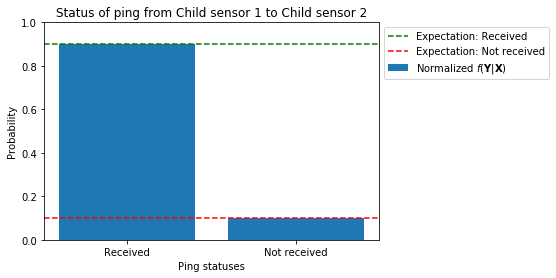

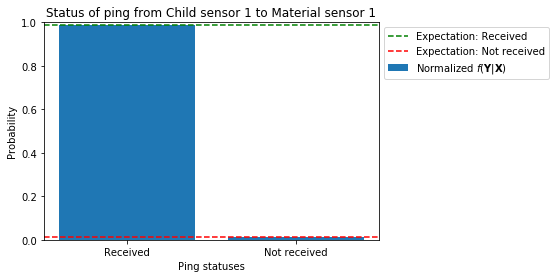

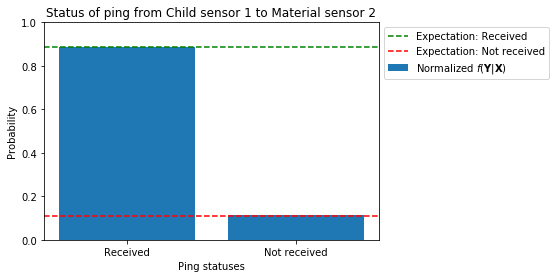

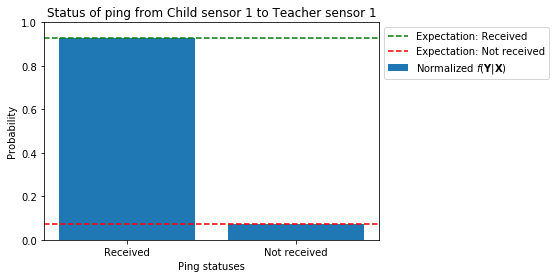

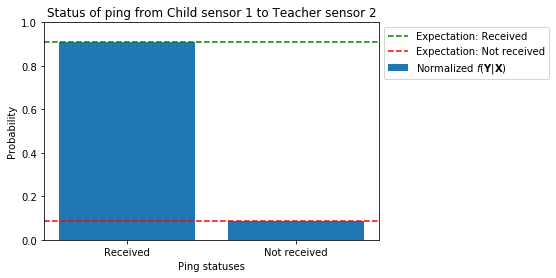

...

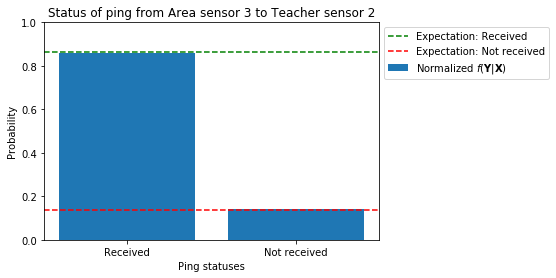

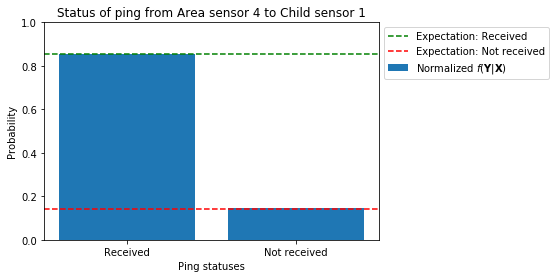

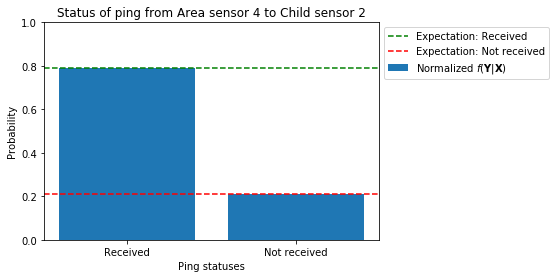

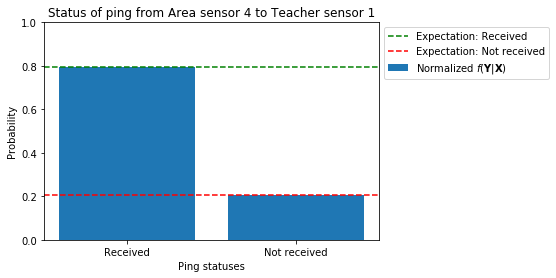

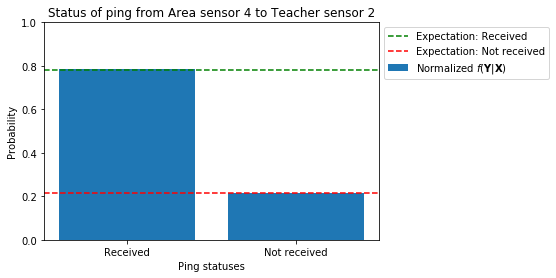

In [88]:
mean_rssi_values = rssi_truncated_mean(distances_test_x_continuous_value)
for y_discrete_var_index in range(num_y_discrete_vars):
    test_y_discrete_value = np.repeat(0, num_y_discrete_vars)
    test_y_continuous_value = np.copy(mean_rssi_values)
    probability_range = np.zeros(2, dtype='float')
    probability_density_range = np.zeros(100, dtype='float')
    rssi_range=np.linspace(mean_rssi_values[y_discrete_var_index] - 2*rssi_untruncated_std_dev,
                           mean_rssi_values[y_discrete_var_index] + 2*rssi_untruncated_std_dev,
                           100)
    for rssi_index in range(len(rssi_range)):
        test_y_continuous_value[y_discrete_var_index] = rssi_range[rssi_index]
        probability_density_range[rssi_index] = math.exp(log_f_y_bar_x(test_x_discrete_value,
                                                                       test_x_continuous_value,
                                                                       test_y_discrete_value,
                                                                       test_y_continuous_value))
    probability_range[0] = np.sum(probability_density_range)*(rssi_range[1]-rssi_range[0])
    test_y_discrete_value[y_discrete_var_index] = 1
    test_y_continuous_value = mean_rssi_values
    probability_range[1] = math.exp(log_f_y_bar_x(test_x_discrete_value,
                                                  test_x_continuous_value,
                                                  test_y_discrete_value,
                                                  test_y_continuous_value))
    probability_range = probability_range/np.sum(probability_range)
    plt.bar(range(num_ping_statuses),
            probability_range,
            label='Normalized $f(\mathbf{Y}|\mathbf{X})$')
    for ping_status_index in range(num_ping_statuses):
        plt.axhline(y=ping_status_probabilities(distances_test_x_continuous_value[y_discrete_var_index])[ping_status_index],
                    linestyle='dashed',
                    color=['green', 'red'][ping_status_index],
                    label='Expectation: {}'.format(ping_status_names[ping_status_index]))
    plt.xticks(range(num_ping_statuses), ping_status_names)
    plt.ylim(0,1)
    plt.xlabel('Ping statuses')
    plt.ylabel('Probability')
    plt.title(y_discrete_names[y_discrete_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

Now we plot the dependence on the continuous sensor variables.

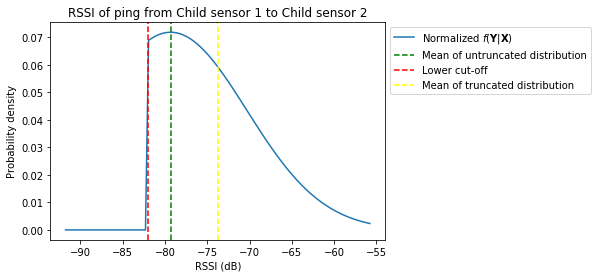

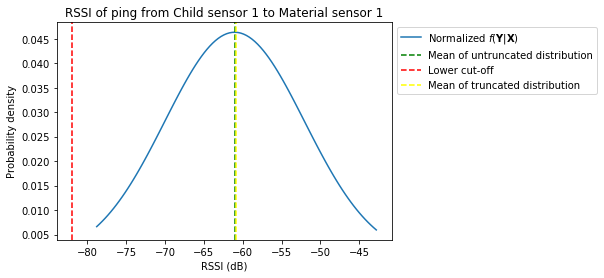

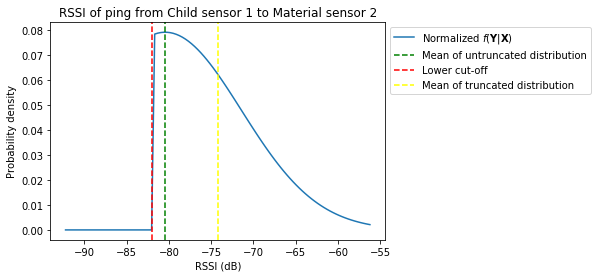

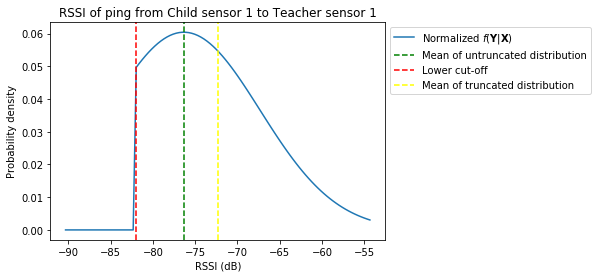

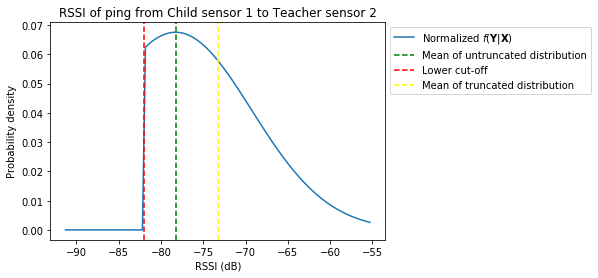

...

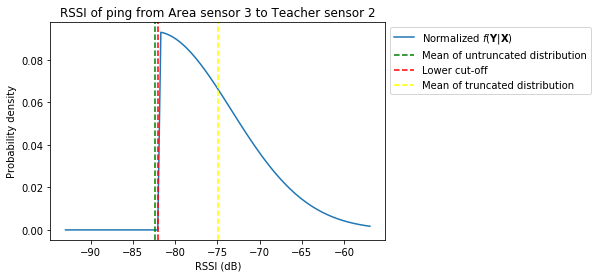

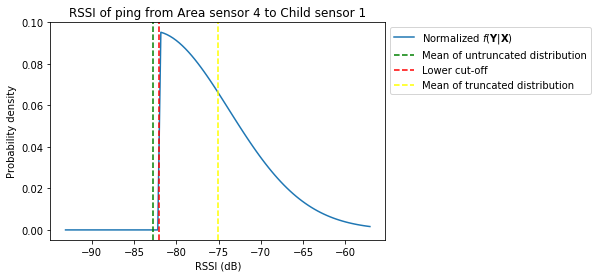

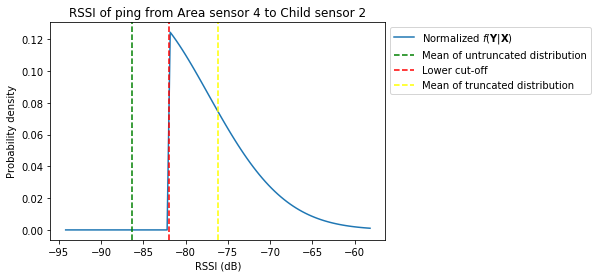

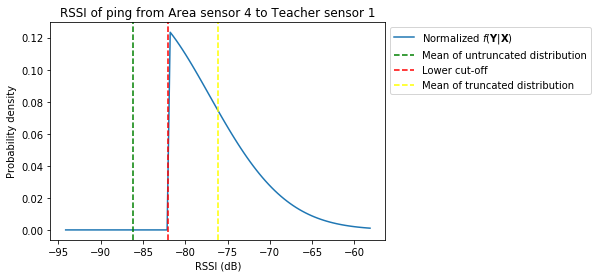

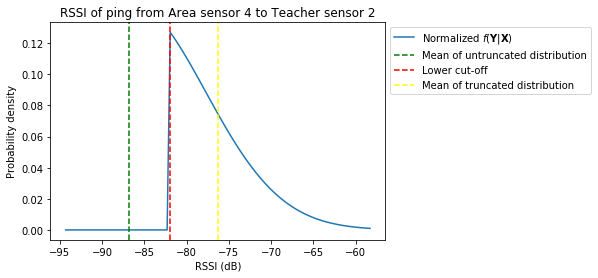

In [89]:
mean_rssi_values = rssi_truncated_mean(distances_test_x_continuous_value)
for y_continuous_var_index in range(num_y_continuous_vars):
    test_y_discrete_value = np.repeat(0, num_y_discrete_vars)
    test_y_continuous_value = np.copy(mean_rssi_values)
    probability_density_range = np.zeros(100, dtype='float')
    rssi_range=np.linspace(mean_rssi_values[y_continuous_var_index] - 2*rssi_untruncated_std_dev,
                           mean_rssi_values[y_continuous_var_index] + 2*rssi_untruncated_std_dev,
                           100)
    for rssi_index in range(len(rssi_range)):
        test_y_continuous_value[y_continuous_var_index] = rssi_range[rssi_index]
        probability_density_range[rssi_index] = math.exp(log_f_y_bar_x(test_x_discrete_value,
                                                                       test_x_continuous_value,
                                                                       test_y_discrete_value,
                                                                       test_y_continuous_value))
    probability_density_range = probability_density_range/(np.sum(probability_density_range)*(rssi_range[1]-rssi_range[0]))
    plt.plot(rssi_range, probability_density_range, label='Normalized $f(\mathbf{Y} | \mathbf{X})$')
    plt.axvline(x=rssi_untruncated_mean(distances_test_x_continuous_value[y_continuous_var_index]),
                linestyle='dashed',
                color='green',
                label='Mean of untruncated distribution')
    plt.axvline(lower_rssi_cutoff,
                linestyle='dashed',
                color='red',
                label='Lower cut-off')
    plt.axvline(x=rssi_truncated_mean(distances_test_x_continuous_value[y_continuous_var_index]),
                linestyle='dashed',
                color='yellow',
                label='Mean of truncated distribution')
    plt.xlabel('RSSI (dB)')
    plt.ylabel('Probability density')
    plt.title(y_continuous_names[y_continuous_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

## Generate simulated $\mathbf{X}$ and $\mathbf{Y}$ data

Set the number of timesteps and initialize the variables.

In [90]:
num_timesteps = 100
t = np.zeros(num_timesteps, dtype='float')
x_discrete_t = np.zeros((num_timesteps, num_x_discrete_vars), dtype='int')
x_continuous_t = np.zeros((num_timesteps, num_x_continuous_vars), dtype='float')
y_discrete_t = np.zeros((num_timesteps, num_y_discrete_vars), dtype='int')
y_continuous_t = np.zeros((num_timesteps, num_y_continuous_vars), dtype='float')

Calculate the simulated data for $t=0$.

In [ ]:
t[0] = 0.0

In [91]:
x_discrete_t[0], x_continuous_t[0] = x_initial_sample()

In [92]:
y_discrete_t[0], y_continuous_t[0] = y_bar_x_sample(x_discrete_t[0], x_continuous_t[0])

Calculate the simulated data for $t>0$.

In [94]:
timestep_size = 1.0

In [95]:
for t_index in range(1,num_timesteps):
    t[t_index] = t[t_index - 1] + timestep_size
    x_discrete_t[t_index], x_continuous_t[t_index] = x_bar_x_prev_sample(x_discrete_t[t_index - 1],
                                                                         x_continuous_t[t_index - 1])
    y_discrete_t[t_index], y_continuous_t[t_index] = y_bar_x_sample(x_discrete_t[t_index],
                                                                    x_continuous_t[t_index])

Find the overall maximum and minimum $h$ and $v$ values across the entire simulation.

In [97]:
h_v_min_max = np.array([[np.min(x_continuous_t[:,range(0, num_x_continuous_vars, 2)]),
                         np.max(x_continuous_t[:,range(0, num_x_continuous_vars, 2)])],
                        [np.min(x_continuous_t[:,range(1, num_x_continuous_vars, 2)]),
                         np.max(x_continuous_t[:,range(1, num_x_continuous_vars, 2)])]])

Plot the positions of the sensors to make sure they have the properties we expect.

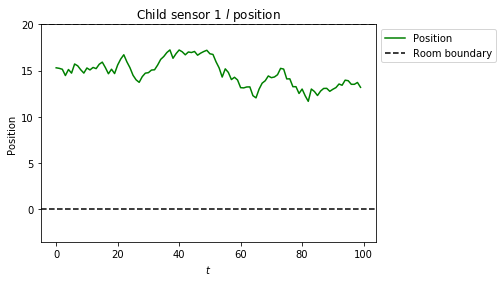

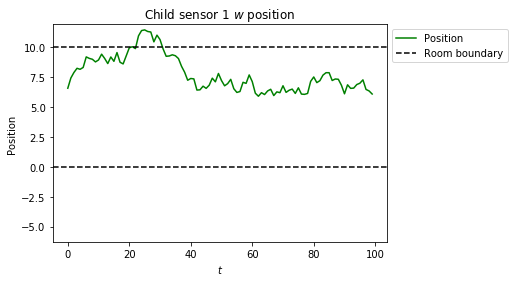

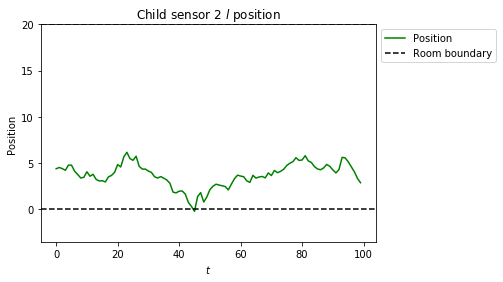

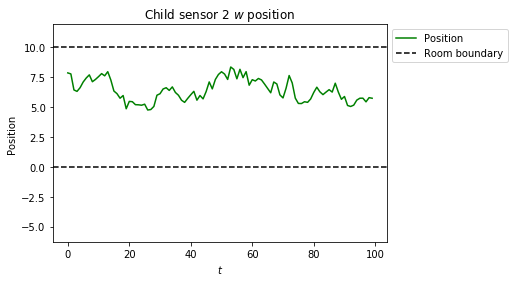

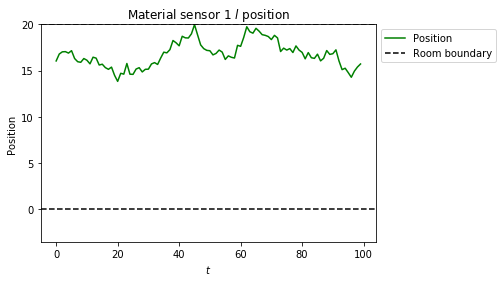

...

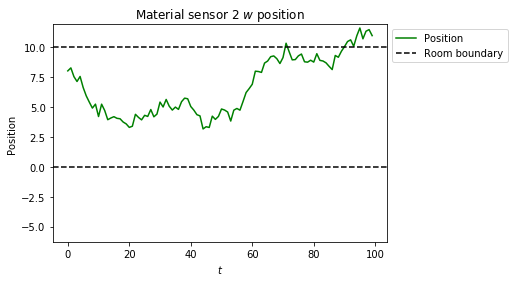

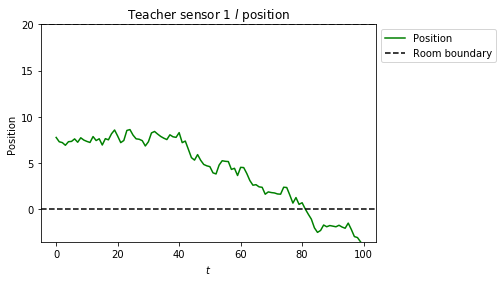

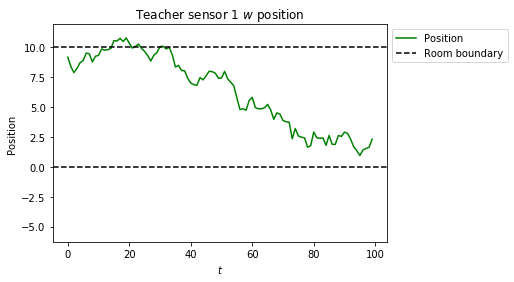

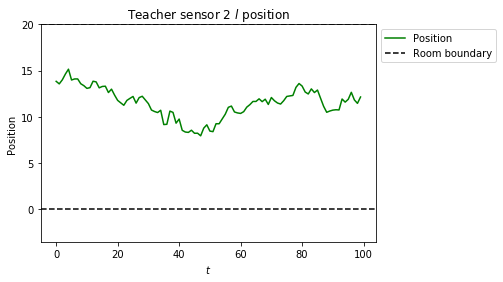

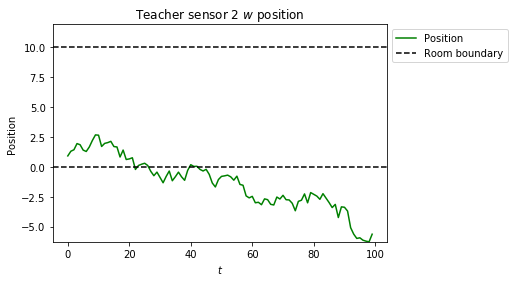

In [98]:
for x_var_index in range(num_x_continuous_vars):
    plt.plot(t, x_continuous_t[:, x_var_index], 'g-', label='Position')
    plt.axhline(0, color='black', linestyle='dashed', label='Room boundary')
    plt.axhline(room_size[x_var_index % 2], color='black', linestyle='dashed')
    plt.plot
    plt.xlabel('$t$')
    plt.ylabel('Position')
    plt.title(x_continuous_names[x_var_index])
    plt.ylim(np.min([0, h_v_min_max[x_var_index % 2, 0]]),
             np.max([room_size[x_var_index % 2], h_v_min_max[x_var_index % 2, 1]]))
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

For each pair of sensors, plot the measured ping statuses against the distance between the sensors. We should see more missed pings for larger distances, but with a lot of noise.

In [99]:
distances_t = distances(sensor_positions(x_continuous_t))

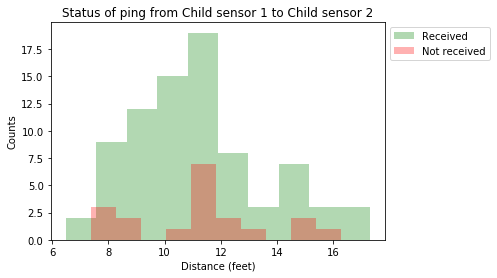

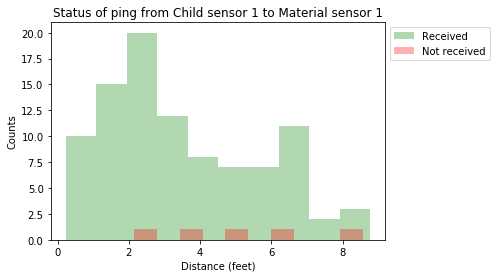

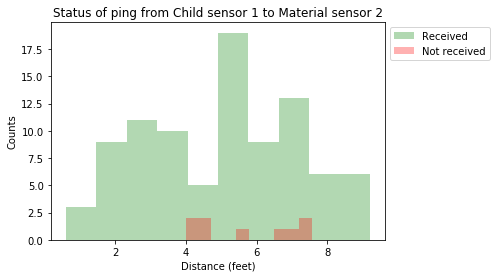

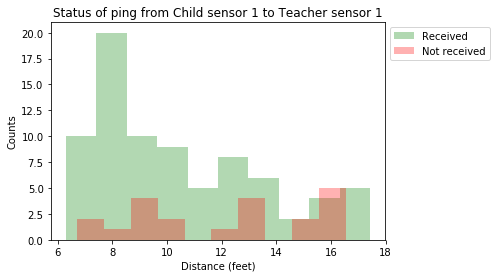

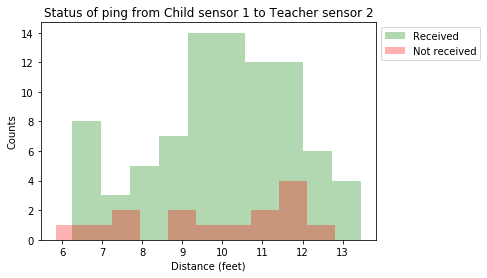

...

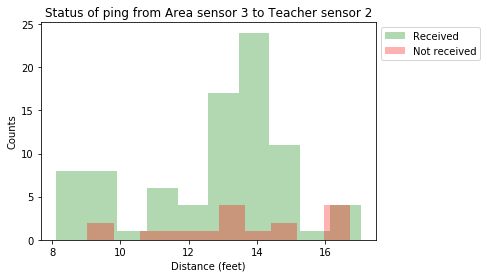

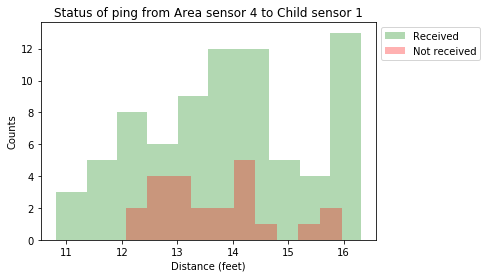

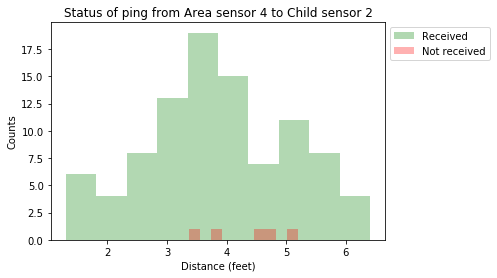

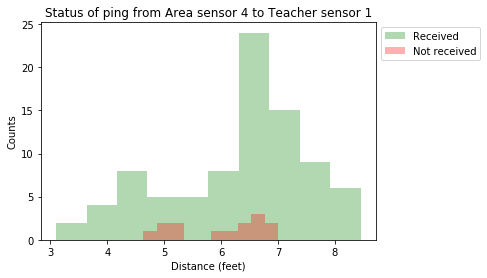

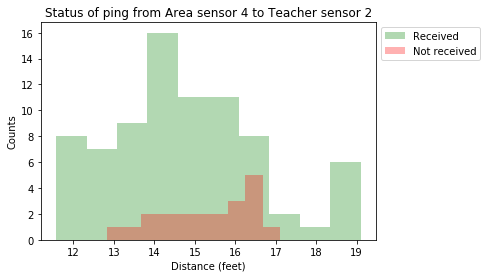

In [100]:
for y_discrete_var_index in range(num_y_discrete_vars):
    plt.hist(distances_t[y_discrete_t[:,y_discrete_var_index] == 0, y_discrete_var_index],
            color='green',
            alpha=0.3,
            label=ping_status_names[0])
    plt.hist(distances_t[y_discrete_t[:,y_discrete_var_index] == 1, y_discrete_var_index],
            color='red',
            alpha=0.3,
            label=ping_status_names[1])
    plt.title(y_discrete_names[y_discrete_var_index])
    plt.xlabel('Distance (feet)')
    plt.ylabel('Counts')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

For each pair of sensors, plot the measured RSSI of the received pings versus the distance between the sensors. We should see a wide range of RSSI readings at each distance, but with a mean value that falls off with distance and a hard cut-off at -82 dB.

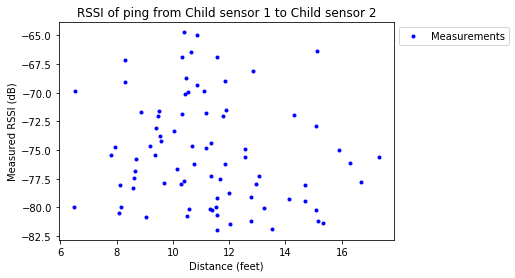

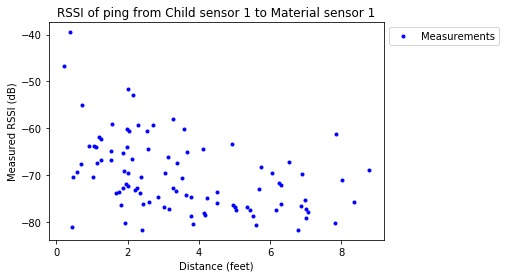

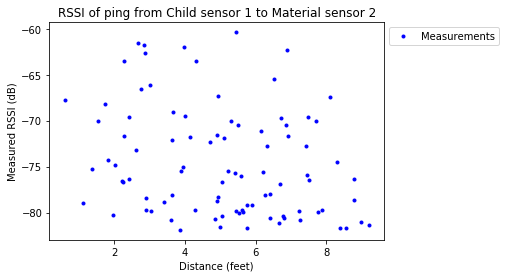

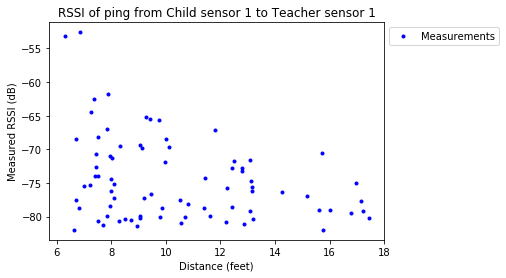

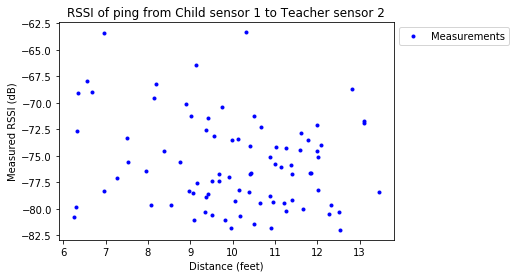

...

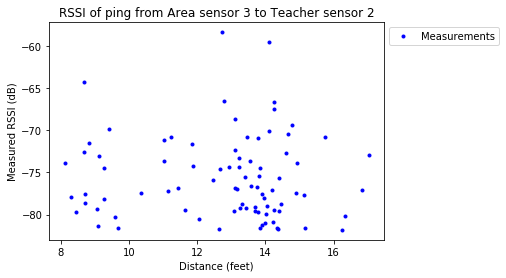

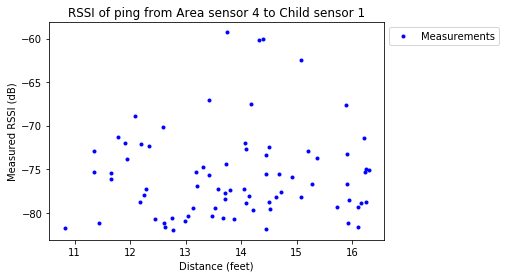

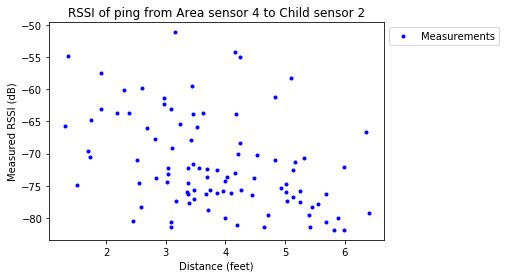

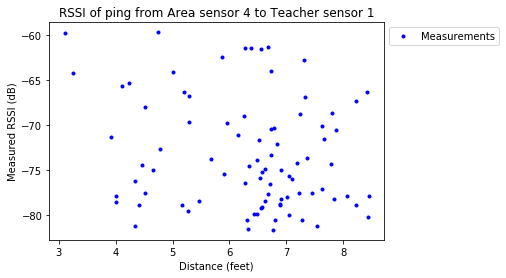

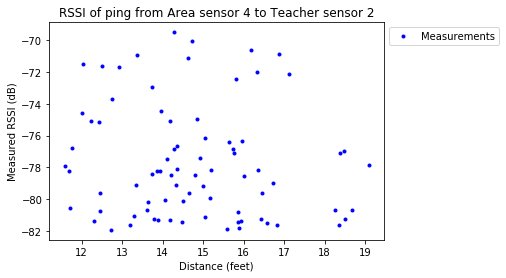

In [101]:
for y_continuous_var_index in range(num_y_continuous_vars):
    plt.plot(distances_t[y_discrete_t[:,y_continuous_var_index] == 0, y_continuous_var_index],
             y_continuous_t[y_discrete_t[:,y_continuous_var_index] == 0, y_continuous_var_index],
             'b.',
            label='Measurements')
    plt.title(y_continuous_names[y_continuous_var_index])
    plt.xlabel('Distance (feet)')
    plt.ylabel('Measured RSSI (dB)')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.show()

## Sample the posterior distribution $f(\mathbf{X}_t | \mathbf{Y}_0, \ldots, \mathbf{Y}_t)$ using a particle filter

Set the number of particles and initialize variables.

In [102]:
num_particles = 10000
particle_discrete_values = np.zeros((num_timesteps, num_particles, num_x_discrete_vars), dtype = 'int')
particle_continuous_values = np.zeros((num_timesteps, num_particles, num_x_continuous_vars), dtype = 'float')
log_particle_weights = np.zeros((num_timesteps, num_particles), dtype = 'float')
sampled_particle_indices = np.zeros((num_timesteps, num_particles), dtype = 'int')

Generate the particles for the initial state $\mathbf{X}_0$.

In [103]:
time_start = time.clock()
particle_discrete_values[0], particle_continuous_values[0] = x_initial_sample(num_particles)
log_particle_weights[0] = log_f_y_bar_x(particle_discrete_values[0],
                                        particle_continuous_values[0],
                                        np.tile(y_discrete_t[0], (num_particles,1)),
                                        np.tile(y_continuous_t[0], (num_particles,1)))
log_particle_weights[0] = log_particle_weights[0] - misc.logsumexp(log_particle_weights[0])
print'Time elapsed = {}'.format(time.clock()-time_start)

Time elapsed = 0.36017152


Calculate the particles for all times $t>0$.

In [104]:
sys.stdout.write('t_index =')
sys.stdout.flush()
time_start = time.clock()
for t_index in range(1, num_timesteps):
    sys.stdout.write(' {}'.format(t_index))
    sys.stdout.flush()
    sampled_particle_indices[t_index - 1] = np.random.choice(num_particles,
                                                             size=num_particles,
                                                             p=np.exp(log_particle_weights[t_index - 1]))
    particle_discrete_values[t_index], particle_continuous_values[t_index] = x_bar_x_prev_sample(particle_discrete_values[t_index - 1,
                                                                                                                          sampled_particle_indices[t_index - 1]],
                                                                                                 particle_continuous_values[t_index - 1,
                                                                                                                            sampled_particle_indices[t_index - 1]])
    log_particle_weights[t_index] = log_f_y_bar_x(particle_discrete_values[t_index],
                                                  particle_continuous_values[t_index],
                                                  np.tile(y_discrete_t[t_index], (num_particles,1)),
                                                  np.tile(y_continuous_t[t_index], (num_particles,1)))
    log_particle_weights[t_index] = log_particle_weights[t_index]- misc.logsumexp(log_particle_weights[t_index])
print'\nTime elapsed = {}'.format(time.clock()-time_start)

t_index = 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99
Time elapsed = 37.21504384


Calculate and plot the maximum particle weight for each time step. When the maximum particle weight increases to 1.0, our particle filter has collapsed around a single value.

In [105]:
max_weights = np.max(np.exp(log_particle_weights), axis=1)

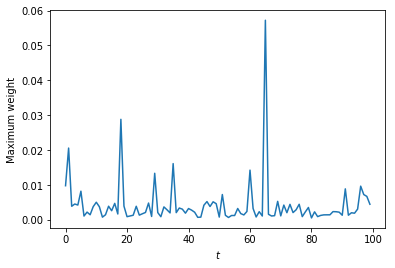

In [106]:
plt.plot(t, max_weights)
plt.xlabel('$t$')
plt.ylabel('Maximum weight')
plt.show()

Calculate and plot the number of particles actually sampled at each time step. If the number of particles actually sampled decreases to 1, our particle filter has collapsed around a single value.

In [107]:
num_sampled_particles = np.array([len(np.unique(sampled_particle_indices[t_index])) for t_index in range(num_timesteps)])

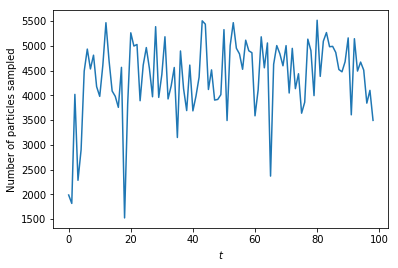

In [108]:
plt.plot(t[:-1], num_sampled_particles[:-1])
plt.xlabel('$t$')
plt.ylabel('Number of particles sampled')
plt.show()

Calculate the sample means and sample standard deviations of the particles at each time $t$.

In [111]:
x_continuous_mean_particle = np.average(
    particle_continuous_values, 
    axis=1, 
    weights=np.repeat(np.exp(log_particle_weights), num_x_continuous_vars).reshape((num_timesteps, num_particles, num_x_continuous_vars))
)

In [112]:
x_continuous_squared_mean_particle = np.average(
    np.square(particle_continuous_values), 
    axis=1,
    weights=np.repeat(np.exp(log_particle_weights), num_x_continuous_vars).reshape((num_timesteps, num_particles, num_x_continuous_vars))
)

In [113]:
x_continuous_sd_particle = np.sqrt(np.abs(x_continuous_squared_mean_particle - np.square(x_continuous_mean_particle)))

Plot the sample means of the particles against the actual values of $\mathbf{X}_t$.

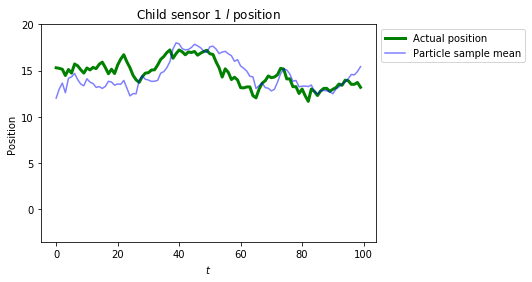

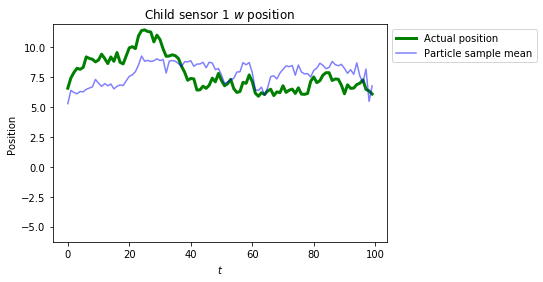

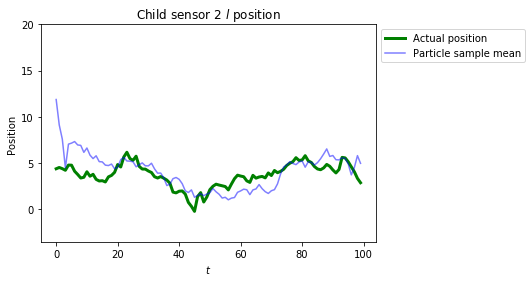

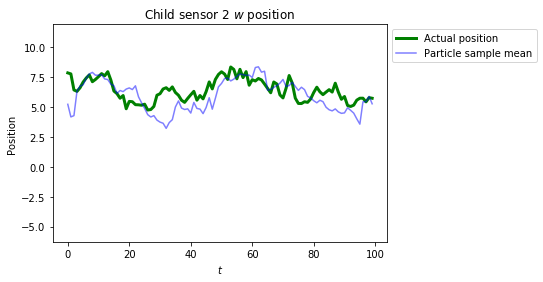

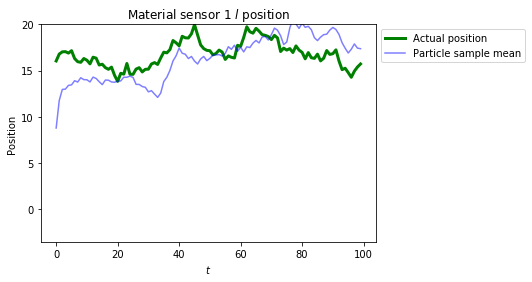

...

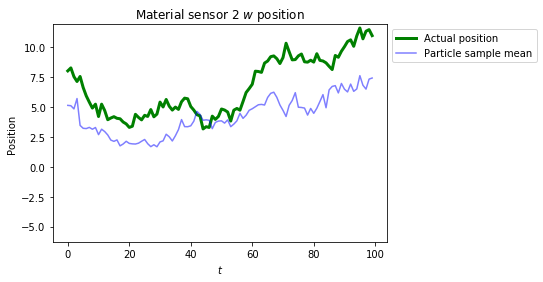

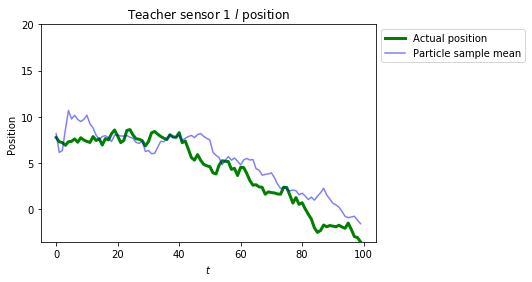

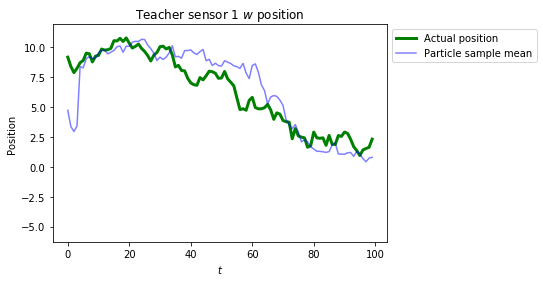

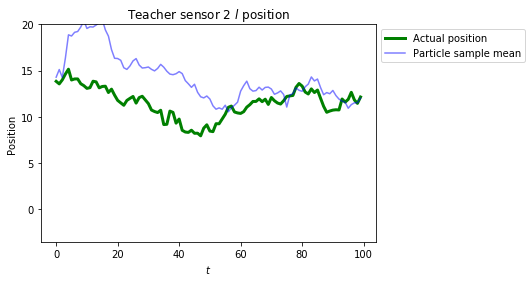

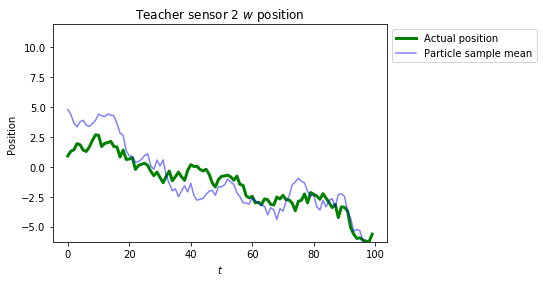

In [114]:
for x_var_index in range(num_x_continuous_vars):
    plt.plot(t, x_continuous_t[:,x_var_index], 'g-', linewidth=3.0, label='Actual position')
    plt.plot(t, x_continuous_mean_particle[:,x_var_index], 'b-', alpha=0.5, label='Particle sample mean')
    plt.xlabel('$t$')
    plt.ylabel('Position')
    plt.title(x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.ylim(np.min([0, h_v_min_max[x_var_index % 2, 0]]),
             np.max([room_size[x_var_index % 2], h_v_min_max[x_var_index % 2, 1]]))
    plt.show()

Plot the sample confidence regions of the particles against the actual values of $\mathbf{X}_t$ (i.e., sample means plus/minus sample standard deviations)

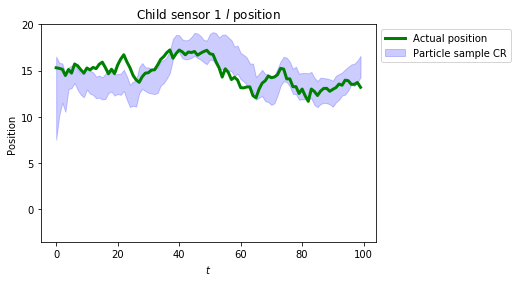

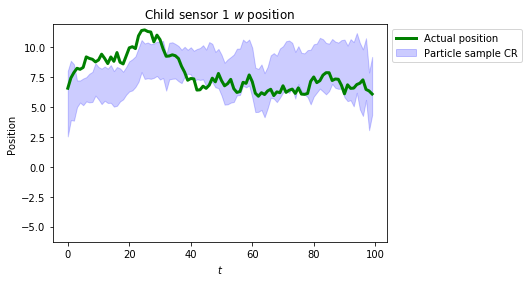

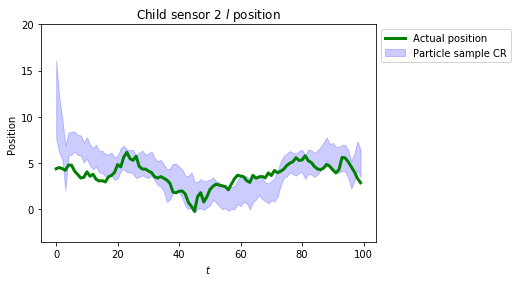

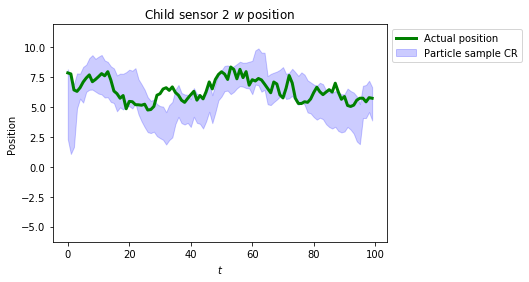

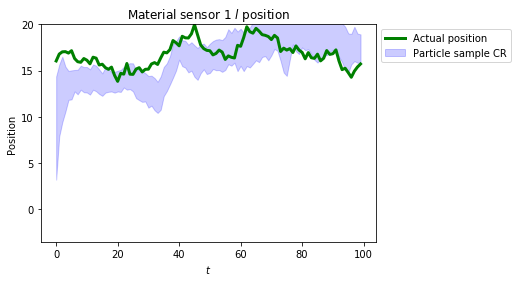

...

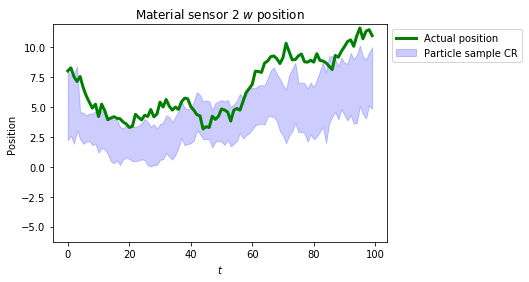

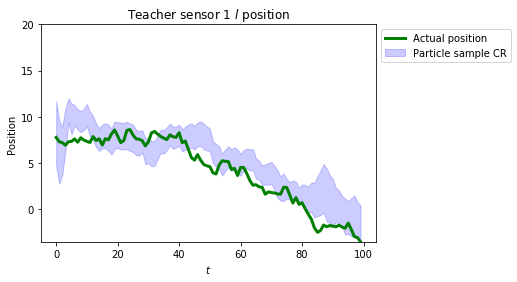

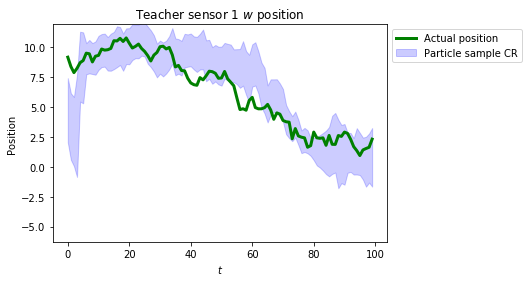

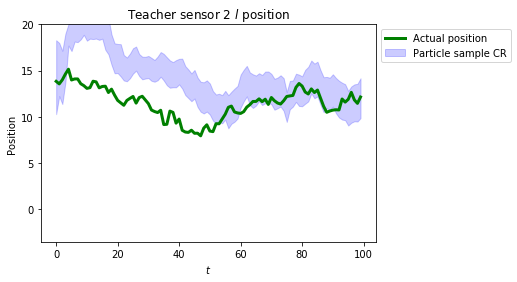

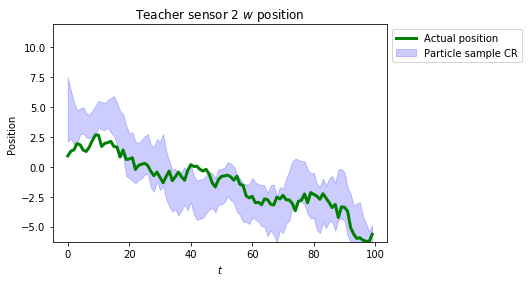

In [115]:
for x_var_index in range(num_x_continuous_vars):
    plt.plot(t, x_continuous_t[:,x_var_index], 'g-', linewidth=3.0, label='Actual position')
    plt.fill_between(
        t,
        x_continuous_mean_particle[:,x_var_index] - x_continuous_sd_particle[:, x_var_index],
        x_continuous_mean_particle[:,x_var_index] + x_continuous_sd_particle[:, x_var_index],
        color='blue',
        alpha=0.2,
        label='Particle sample CR'
    )
    plt.xlabel('$t$')
    plt.ylabel('Position')
    plt.title(x_continuous_names[x_var_index])
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.ylim(np.min([0, h_v_min_max[x_var_index % 2, 0]]),
             np.max([room_size[x_var_index % 2], h_v_min_max[x_var_index % 2, 1]]))
    plt.show()

Visualize the actual particles for a few chosen time steps.

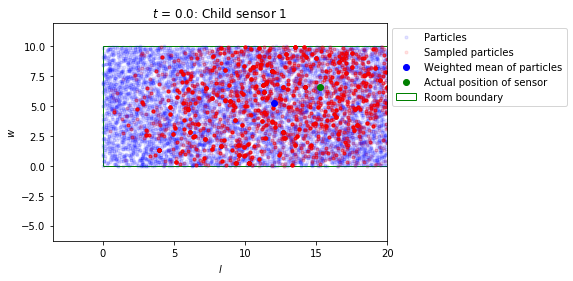

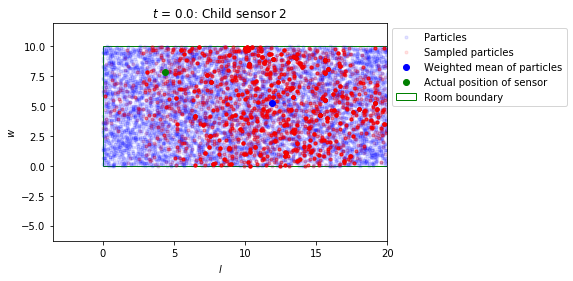

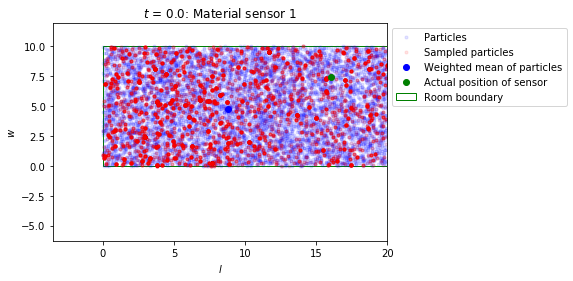

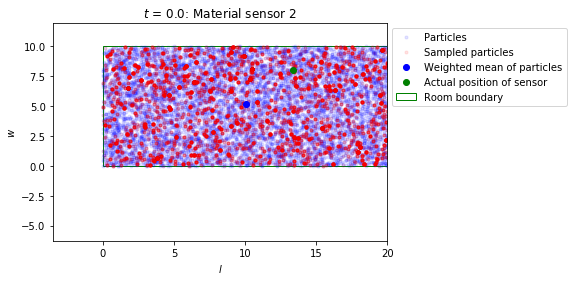

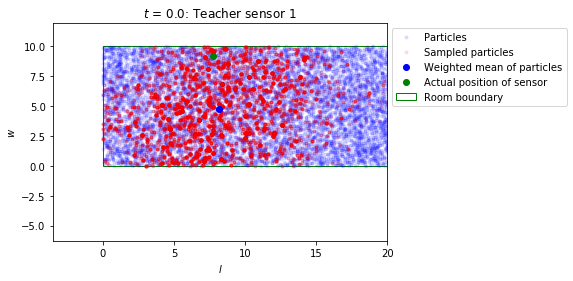

...

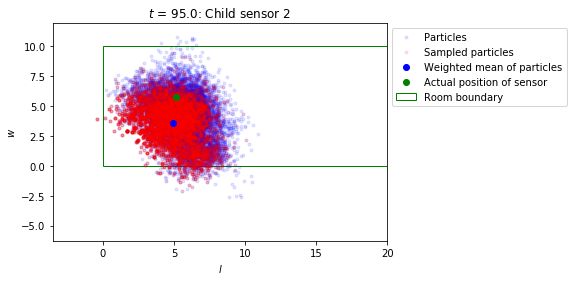

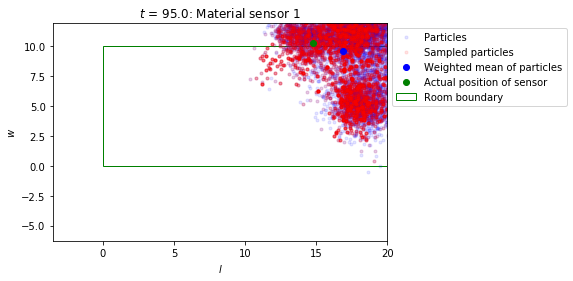

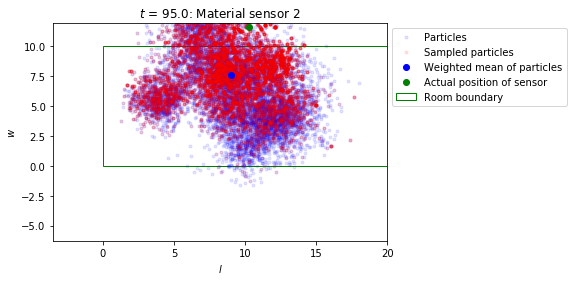

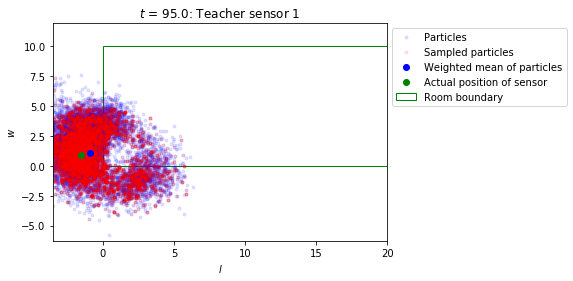

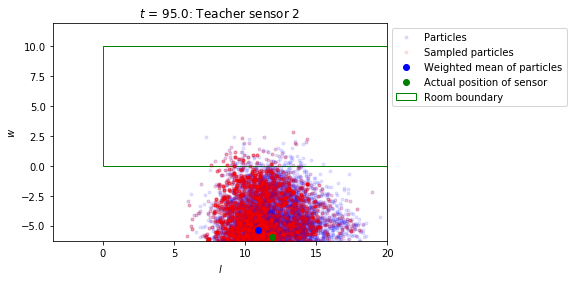

In [116]:
for t_index in [0, 50, 95]:
    for sensor_index in range(num_moving_sensors):
        plt.plot(particle_continuous_values[t_index, :, sensor_index*2],
                 particle_continuous_values[t_index, :, sensor_index*2 + 1],
                'b.',
                alpha=0.1,
                label='Particles')
        plt.plot(particle_continuous_values[t_index, sampled_particle_indices[t_index], sensor_index*2],
                 particle_continuous_values[t_index, sampled_particle_indices[t_index], sensor_index*2 + 1],
                'r.',
                alpha=0.1,
                label='Sampled particles')
        plt.plot(x_continuous_mean_particle[t_index, sensor_index*2],
                 x_continuous_mean_particle[t_index, sensor_index*2 + 1],
                 'bo',
                 label = 'Weighted mean of particles')
        plt.plot(x_continuous_t[t_index, sensor_index*2],
                 x_continuous_t[t_index, sensor_index*2 + 1],
                 'go',
                 label = 'Actual position of sensor')
        plt.title('$t$ = {}: {}'.format(t[t_index],
                                       sensor_names[sensor_index]))
        plt.xlabel(dimension_names[0])
        plt.ylabel(dimension_names[1])
        plt.xlim(np.min([0, h_v_min_max[0, 0]]),
                 np.max([room_size[0], h_v_min_max[0, 1]]))
        plt.ylim(np.min([0, h_v_min_max[1, 0]]),
                 np.max([room_size[1], h_v_min_max[1, 1]]))
        ax=plt.gca()
        ax.add_patch(patches.Rectangle((0,0),
                                       room_size[0],
                                       room_size[1],
                                       fill=False,
                                       color='green',
                                       label='Room boundary'))
        plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
        plt.show()